In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
from solver import *
from psiop import *

In [3]:
# Declaration of necessary variables
f = Function('f')
g = Function('g')

# Symbol manipulation

## Basic input cases

### 1D

In [4]:
# Define SymPy variables
x = symbols('x', real=True)
xi = symbols('xi', real=True)

# Symbolic expression p(x, ξ) = x * ξ
expr_symbol = x * xi

# Creation of the operator in 'symbol' mode
try:
    op = PseudoDifferentialOperator(expr=expr_symbol, vars_x=[x], mode='symbol')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    xi_vals = np.array([3.0, 4.0])
    result = op.p_func(x_vals[:, None], xi_vals[None, :])  # shape (2, 2)

    expected = x_vals[:, None] * xi_vals[None, :]
    assert np.allclose(result, expected), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 'symbol' mode test successful")
except Exception as e:
    print(f"❌ 'symbol' mode test failed: {e}")


✅ 'symbol' mode test successful


In [5]:
# Sympy Variables
x = symbols('x', real=True)
u = Function('u')

# Differential operator: ∂u/∂x
expr_auto = diff(u(x), x)

# Creation of the operator in 'auto' mode
try:
    op = PseudoDifferentialOperator(expr=expr_auto, vars_x=[x], var_u=u(x), mode='auto')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    xi_vals = np.array([3.0, 4.0])
    result = op.p_func(x_vals[:, None], xi_vals[None, :])

    expected = 1j * xi_vals[None, :]  # Symbol: iξ
    assert np.allclose(result, expected, atol=1e-6), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 'auto' mode test successful")
except Exception as e:
    print(f"❌ 'auto' mode test failed: {e}")



symbol = 
ⅈ⋅ξ
✅ 'auto' mode test successful


In [6]:
x = symbols('x', real=True)
expr = x  # Any expression
# Test 1: invalid mode
try:
    op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='invalid_mode')
    print("❌ Test failed: no error raised for invalid mode")
except ValueError as e:
    if "mode must be 'auto' or 'symbol'" in str(e):
        print("✅ Correct exception raised for invalid mode")
    else:
        print(f"❌ Wrong exception raised for invalid mode: {e}")
# Test 2: 'auto' mode without var_u
try:
    op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='auto')
    print("❌ Test failed: no error raised for missing var_u")
except ValueError as e:
    if "var_u must be provided in mode='auto'" in str(e):
        print("✅ Correct exception raised for missing var_u")
    else:
        print(f"❌ Wrong exception raised for missing var_u: {e}")


✅ Correct exception raised for invalid mode
✅ Correct exception raised for missing var_u


### 2D

In [7]:
# Sympy Variables
x, y = symbols('x y', real=True)
xi, eta = symbols('xi eta', real=True)

# Symbolic expression p(x, y, ξ, η) = x*y*ξ + η**2
expr_symbol = x * y * xi + eta**2

# Creation of the operator in 'symbol' mode
try:
    op = PseudoDifferentialOperator(expr=expr_symbol, vars_x=[x, y], mode='symbol')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    y_vals = np.array([0.5, 1.5])
    xi_vals = np.array([2.0, 3.0])
    eta_vals = np.array([1.0, 4.0])

    result = op.p_func(
        x_vals[:, None, None, None],
        y_vals[None, :, None, None],
        xi_vals[None, None, :, None],
        eta_vals[None, None, None, :]
    )

    expected = (
        x_vals[:, None, None, None] *
        y_vals[None, :, None, None] *
        xi_vals[None, None, :, None] +
        eta_vals[None, None, None, :]**2
    )

    assert np.allclose(result, expected), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 2D 'symbol' mode test successful")
except Exception as e:
    print(f"❌ 2D 'symbol' mode test failed: {e}")


✅ 2D 'symbol' mode test successful


In [8]:
# Sympy Variables
x, y = symbols('x y', real=True)
u = Function('u')

# Differential operator: Δu = ∂²u/∂x² + ∂²u/∂y²
expr_auto = diff(u(x, y), x, 2) + diff(u(x, y), y, 2)

# Creation of the operator in 'auto' mode
try:
    op = PseudoDifferentialOperator(expr=expr_auto, vars_x=[x, y], var_u=u(x, y), mode='auto')

    # Check that p_func is well defined
    assert callable(op.p_func), "p_func should be a function"

    # Numerical evaluation test
    x_vals = np.array([1.0, 2.0])
    y_vals = np.array([0.5, 1.5])
    xi_vals = np.array([2.0, 3.0])
    eta_vals = np.array([1.0, 4.0])

    result = op.p_func(
        x_vals[:, None, None, None],
        y_vals[None, :, None, None],
        xi_vals[None, None, :, None],
        eta_vals[None, None, None, :]
    )

    expected = -(xi_vals[None, None, :, None]**2 + eta_vals[None, None, None, :]**2)

    assert np.allclose(result, expected), f"Incorrect result: {result}, expected: {expected}"
    print("✅ 2D 'auto' mode test successful")
except Exception as e:
    print(f"❌ 2D 'auto' mode test failed: {e}")



symbol = 
   2    2
- η  - ξ 
✅ 2D 'auto' mode test successful


In [9]:
# Sympy Variables
x, y = symbols('x y', real=True)
expr = x * y  # Any expression

try:
    op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='invalid_mode')
    print("❌ Test failure: no error raised for invalid mode")
except ValueError as e:
    if "mode must be 'auto' or 'symbol'" in str(e):
        print("✅ Correct exception raised for invalid mode")
    else:
        print(f"❌ Wrong exception raised for invalid mode: {e}")


✅ Correct exception raised for invalid mode


In [10]:
# Sympy variables in 3D
x, y, z = symbols('x y z', real=True)
u = Function('u')

# Arbitrary differential operator
expr_3d = u(x, y, z).diff(x, 2) + u(x, y, z).diff(y, 2) + u(x, y, z).diff(z, 2)

try:
    op = PseudoDifferentialOperator(expr=expr_3d, vars_x=[x, y, z], var_u=u(x, y, z), mode='auto')
    print("❌ Test failure: no error raised for dim = 3")
except NotImplementedError as e:
    if "Only 1D and 2D supported" in str(e):
        print("✅ Correct exception raised for dimension 3")
    else:
        print(f"❌ Wrong exception raised: {e}")


✅ Correct exception raised for dimension 3


## A symbol constructor

In [11]:
x, y, xi, eta = symbols('x y xi eta', real=True)

alpha = 1

symbol = make_symbol(
    g=[[1, 0], [0, -2]],
    b=[-(y-1), (x+1)],
    V=1/(1+(x-1)**2+(y-1)**2)
)
p2d = PseudoDifferentialOperator(expr=symbol, vars_x=[x, y], mode='symbol')

p2d.interactive_symbol_analysis(
                            xlim=(-10, 10),
                            ylim=(-10, 10),
                            xi_range=(-10, 10),
                            eta_range=(-10, 10),
                            density=50)

## Symbol analysis

### 1D basic plottings

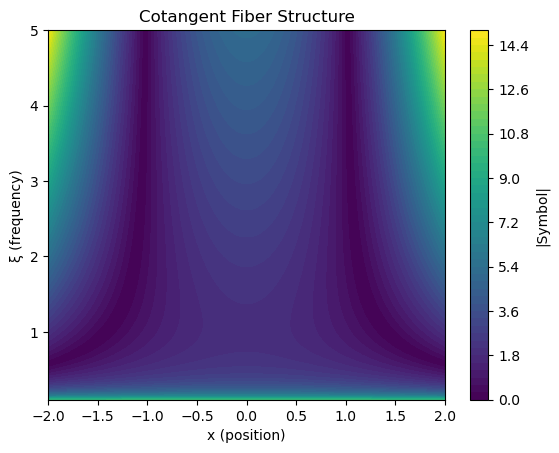

In [12]:
# Definition of variables
x, xi = symbols('x xi', real=True)
expr = (1 - x**2)*xi + 1/xi

# Instantiation of the pseudo-differential operator
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')

# Spatial and frequency grids for visualization
x_grid = np.linspace(-2, 2, 100)   # x ∈ [-2, 2]
xi_grid = np.linspace(0.1, 5, 100) # ξ ∈ [0.1, 5]

# Visualize the fiber at a fixed spatial point x = 0
p.visualize_fiber(x_grid=x_grid, xi_grid=xi_grid, x0=5.0)


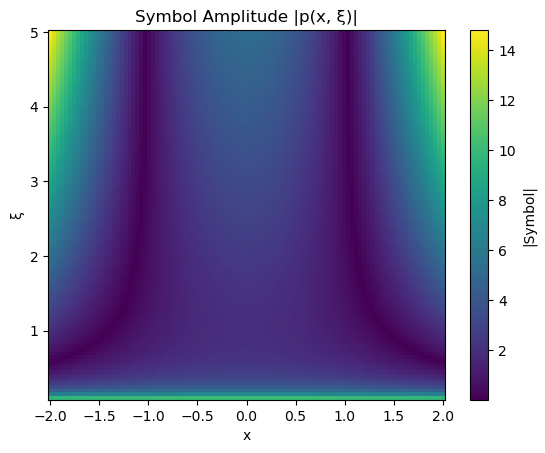

In [13]:
# Define the spatial and frequency grids
x_grid = np.linspace(-2, 2, 100)     # Spatial domain: x ∈ [-2, 2]
xi_grid = np.linspace(0.1, 5, 100)   # Frequency domain: ξ ∈ [0.1, 5]

# Visualize the amplitude of the symbol
p.visualize_symbol_amplitude(x_grid=x_grid, xi_grid=xi_grid)

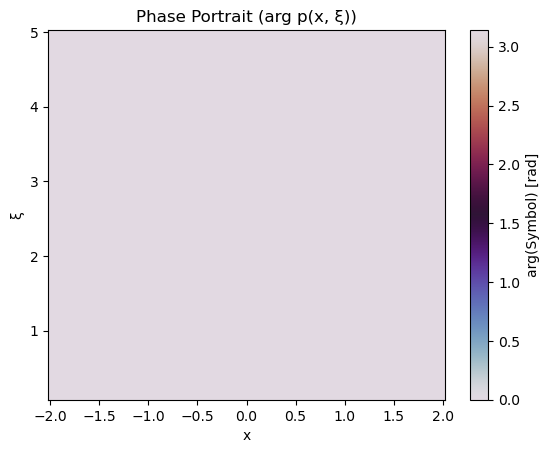

In [14]:
p.visualize_phase(
    x_grid=np.linspace(-2, 2, 100),   # Spatial grid range
    xi_grid=np.linspace(0.1, 5, 100), # Frequency grid range
    xi0=1.0                           # Fixed frequency slice for 2D if needed
)

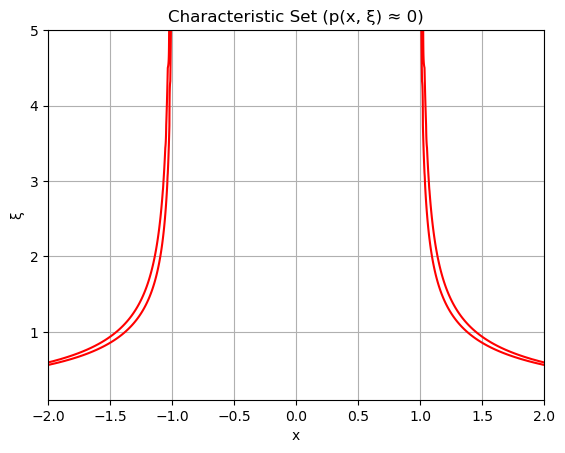

In [15]:
# Visualization grids
x_vals = np.linspace(-2, 2, 200)     # Spatial space
xi_vals = np.linspace(0.1, 5, 200)   # Frequency (ξ)

# Correct call of the method
p.visualize_characteristic_set(
    x_grid=x_vals,
    xi_grid=xi_vals
)


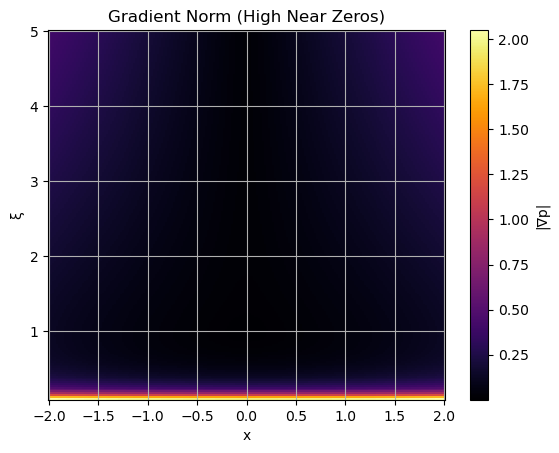

In [16]:
# Visualization grids
x_vals = np.linspace(-2, 2, 200)     # Spatial space
xi_vals = np.linspace(0.1, 5, 200)   # Frequency (ξ)

# Correct call of the method
p.visualize_characteristic_gradient(
    x_grid=x_vals,
    xi_grid=xi_vals
)

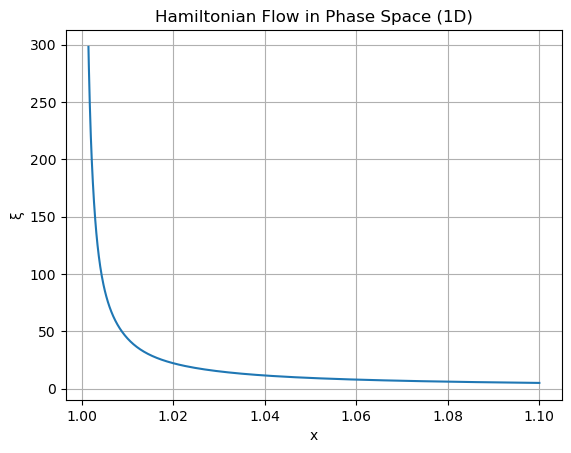

In [17]:
# Plot Hamiltonian flow in phase space
x, xi = symbols('x xi', real=True)
p.plot_hamiltonian_flow(
    x0=1.1,       # Initial position
    xi0=5.0,      # Initial momentum (frequency)
    tmax=2.0,     # Final integration time
    n_steps=200   # Number of time steps
)

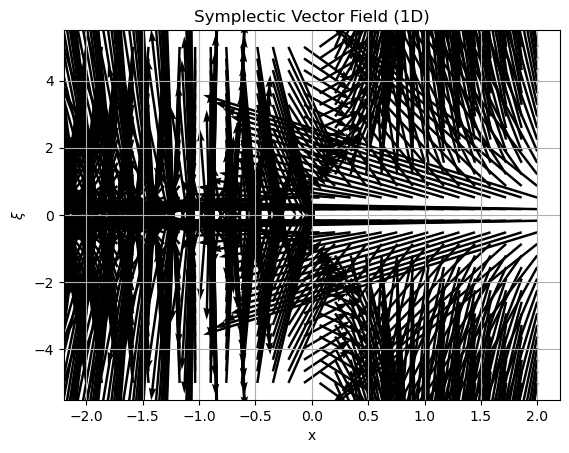

In [18]:
# Call the symplectic vector field visualization method
p.plot_symplectic_vector_field(
    xlim=(-2, 2),     # Spatial domain range
    klim=(-5, 5),     # Frequency (ξ) domain range
    density=30        # Grid resolution per axis
)

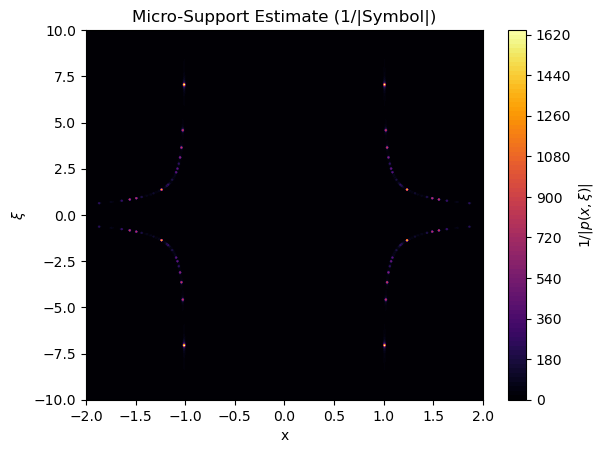

In [19]:
# Call visualize_micro_support with appropriate parameters
p.visualize_micro_support(
    xlim=(-2, 2),           # Spatial domain limits
    klim=(-10, 10),         # Frequency domain limits
    threshold=1e-3,         # Threshold for numerical stability
    density=300             # Number of grid points per axis
)

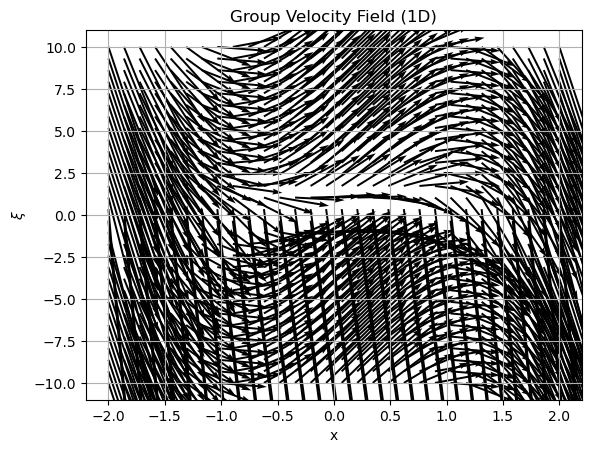

In [20]:
# Call the group_velocity_field method to visualize ∇_ξ p(x, ξ)
p.group_velocity_field(
    xlim=(-2, 2),     # Spatial domain limits
    klim=(-10, 10),   # Frequency domain limits
    density=30        # Grid resolution
)

In [21]:
# Animate singularity propagation under Hamiltonian flow
ani = p.animate_singularity(
    xi0=5.0,       # Initial frequency ξ₀
    x0=0.0,        # Initial spatial position x₀
    tmax=4.0,      # Total integration time
    n_frames=100,  # Number of animation frames
    projection='frequency'  # Choose visualization: 'phase', 'position', or 'frequency'
)

# Display the animation in Jupyter Notebook
HTML(ani.to_jshtml())

H =  {'dx/dt': -x**2 + 1 - 1/xi**2, 'dxi/dt': 2*x*xi}


### 1D interactive plottings

In [22]:
p.interactive_symbol_analysis(
                            xlim=(-2, 2),
                            xi_range=(0.1, 5),
                            density=100)


### 2D basic plottings

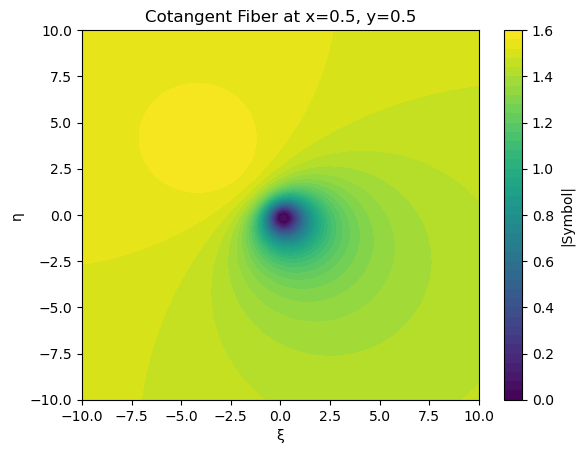

Visualizing cotangent fiber at fixed point: (x=0.5, y=0.5)


In [23]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator in 'symbol' mode
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')


# === New Test: visualize_fiber for 2D operator ===

# Define spatial and frequency grids
xi_vals = np.linspace(-10, 10, 200)  # Frequency grid (ξ, η)
x0 = 0.5  # Fixed x-coordinate
y0 = 0.5  # Fixed y-coordinate

# Call visualize_fiber to examine the cotangent fiber at (x0, y0)
p2d.visualize_fiber(
    x_grid=None,        # Not used in 2D
    xi_grid=xi_vals,    # Frequency grid
    x0=x0,              # Base point x-coordinate
    y0=y0               # Base point y-coordinate
)

print(f"Visualizing cotangent fiber at fixed point: (x={x0}, y={y0})")

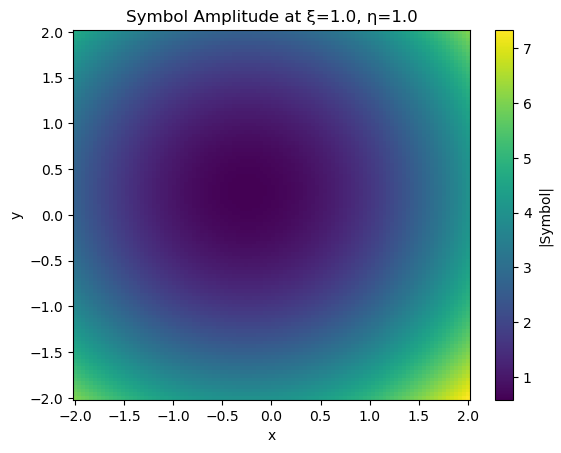

In [24]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Visualization using visualize_symbol_amplitude ---

# Define spatial grid
x_vals = np.linspace(-2, 2, 100)
y_vals = np.linspace(-2, 2, 100)

# Define frequency grid
xi_vals = np.linspace(-5, 5, 100)
eta_vals = np.linspace(-5, 5, 100)

# Fix frequency values for 2D visualization
xi0 = 1.0
eta0 = 1.0

# Call the visualization method
p2d.visualize_symbol_amplitude(
    x_grid=x_vals,
    y_grid=y_vals,
    xi_grid=xi_vals,
    eta_grid=eta_vals,
    xi0=xi0,
    eta0=eta0
)

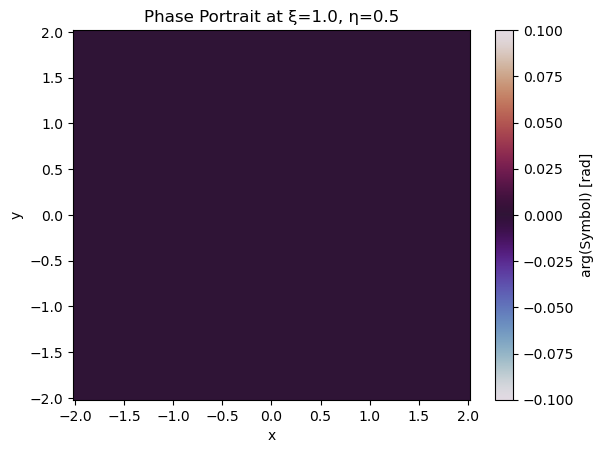

In [25]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol (rational symbol with spatial and frequency dependence)
expr_2d = ((1 + x**2 + y**2) * (xi**2 + eta**2) + x * eta - y * xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator in 'symbol' mode
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Visualization using visualize_phase ---

# Define grids for visualization
x_vals = np.linspace(-2, 2, 100)   # Spatial grid in x
y_vals = np.linspace(-2, 2, 100)   # Spatial grid in y
xi_vals = np.linspace(-5, 5, 100)  # Frequency grid in xi
eta_vals = np.linspace(-5, 5, 100) # Frequency grid in eta

# Fixed frequency values for slicing in 2D
xi0 = 1.0
eta0 = 0.5

# Call visualize_phase with appropriate parameters
p2d.visualize_phase(
    x_grid=x_vals,
    xi_grid=xi_vals,
    y_grid=y_vals,
    eta_grid=eta_vals,  # Optional, included for API consistency
    xi0=xi0,
    eta0=eta0
)

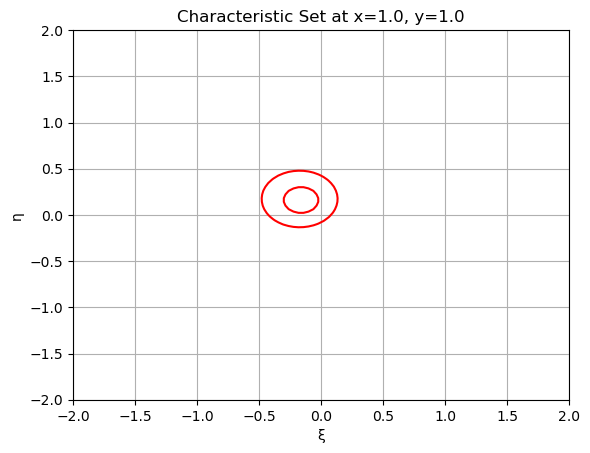

In [26]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Instantiate the pseudo-differential operator
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Visualize the characteristic set ---

# Define spatial and frequency grids
x_vals = np.linspace(-2, 2, 100)     # Spatial grid in x
y_vals = np.linspace(-2, 2, 100)     # Spatial grid in y
xi_vals = np.linspace(-2, 2, 100)    # Frequency grid for ξ
eta_vals = np.linspace(-2, 2, 100)   # Frequency grid for η

# Fixed spatial point for 2D visualization
x0 = 1.0
y0 = 1.0

# Call visualize_characteristic_set
p2d.visualize_characteristic_set(
    x_grid=x_vals,
    xi_grid=xi_vals,
    eta_grid=eta_vals,
    y0=y0,
    x0=x0
)

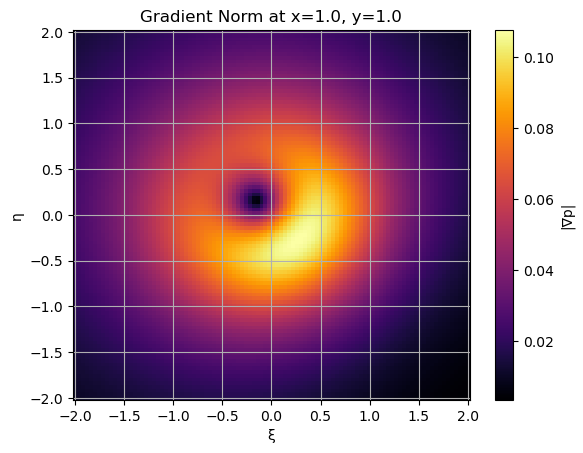

In [27]:
# Fixed spatial point for 2D visualization
x0 = 1.0
y0 = 1.0

# Call visualize_characteristic_set
p2d.visualize_characteristic_gradient(
    x_grid=x_vals,
    xi_grid=xi_vals,
    eta_grid=eta_vals,
    y0=y0,
    x0=x0
)


Plotting Hamiltonian flow for 2D pseudo-differential operator...


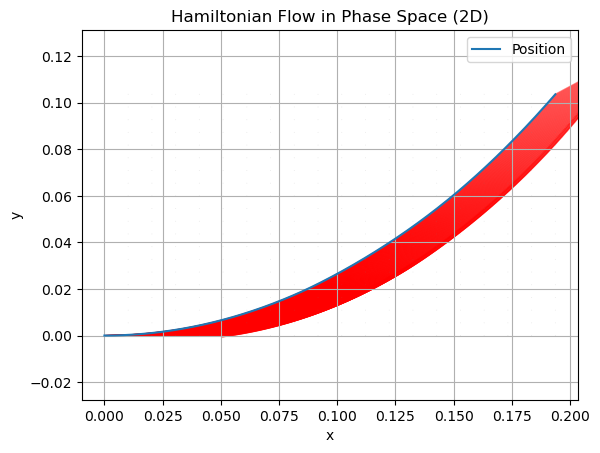

In [28]:
# Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D pseudo-differential symbol
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Create the pseudo-differential operator
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

# --- Plot Hamiltonian flow in phase space ---
# This visualizes how singularities propagate under the Hamiltonian dynamics
# derived from the principal symbol of the operator.

print("\nPlotting Hamiltonian flow for 2D pseudo-differential operator...")
p2d.plot_hamiltonian_flow(
    x0=0.0,      # Initial x position
    y0=0.0,      # Initial y position
    xi0=5.0,     # Initial momentum in x direction
    eta0=0.0,    # Initial momentum in y direction
    tmax=10.0,   # Total integration time
    n_steps=500  # Number of time steps
)

In [29]:
# Define symbolic variables for 2D pseudo-differential operator
x, y, xi, eta = symbols('x y xi eta', real=True)

# Define a 2D symbol expression: ((1 + x^2 + y^2)(xi^2 + eta^2) + x*eta - y*xi) / (1 + xi^2 + eta^2)
expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

# Instantiate the pseudo-differential operator in symbolic mode
p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')


# Animate the propagation of a singularity under the Hamiltonian flow induced by the symbol
print("\nAnimating singularity propagation...")
ani = p2d.animate_singularity(
    xi0=5.0,      # Initial frequency component along x
    eta0=0.0,     # Initial frequency component along y
    x0=0.0,       # Initial spatial position x₀
    y0=0.0,       # Initial spatial position y₀
    tmax=4.0,     # Total time of integration
    n_frames=100, # Number of frames in the animation
    projection='position'  # Projection type: 'position', 'frequency', or 'phase'
)

# Display the animation in Jupyter notebook
HTML(ani.to_jshtml())


Animating singularity propagation...
H =  {'dx/dt': -2*xi*(eta*x - xi*y + (eta**2 + xi**2)*(x**2 + y**2 + 1))/(eta**2 + xi**2 + 1)**2 + (2*xi*(x**2 + y**2 + 1) - y)/(eta**2 + xi**2 + 1), 'dy/dt': -2*eta*(eta*x - xi*y + (eta**2 + xi**2)*(x**2 + y**2 + 1))/(eta**2 + xi**2 + 1)**2 + (2*eta*(x**2 + y**2 + 1) + x)/(eta**2 + xi**2 + 1), 'dxi/dt': -(eta + 2*x*(eta**2 + xi**2))/(eta**2 + xi**2 + 1), 'deta/dt': -(-xi + 2*y*(eta**2 + xi**2))/(eta**2 + xi**2 + 1)}


### 2D interactive plottings

In [30]:
x, y, xi, eta = symbols('x y xi eta', real=True)

expr_2d = ((1 + x**2 + y**2)*(xi**2 + eta**2) + x*eta - y*xi) / (1 + xi**2 + eta**2)

p2d = PseudoDifferentialOperator(expr=expr_2d, vars_x=[x, y], mode='symbol')

p2d.interactive_symbol_analysis(
                            xlim=(-2, 2),
                            ylim=(-2, 2),
                            xi_range=(-2, 2),
                            eta_range=(-2, 2),
                            density=50)


### Singularity Flow

In [31]:
x, xi = symbols('x xi', real=True)
expr = xi**3 + sin(x) * xi

op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
ani = op.animate_singularity(xi0=2.0, tmax=10.0)
ani

H =  {'dx/dt': 3*xi**2 + sin(x), 'dxi/dt': -xi*cos(x)}


In [32]:
x, xi = symbols('x xi', real=True)
expr = xi**3 + I*sin(x) * xi

op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
ani = op.animate_singularity(xi0=2.0, tmax=10.0, projection='position')
ani

H =  {'dx/dt': 3*xi**2 + I*sin(x), 'dxi/dt': -I*xi*cos(x)}
⚠️ The Hamiltonian field is complex. Only the real part is used for integration.


In [33]:
x, y, xi, eta = symbols('x y xi eta', real=True)
expr2d = x * eta - y * xi

op2 = PseudoDifferentialOperator(expr=expr2d, vars_x=[x, y], mode='symbol')
ani = op2.animate_singularity(xi0=2.0, eta0=0.0, projection='frequency', tmax=20)
ani

H =  {'dx/dt': -y, 'dy/dt': x, 'dxi/dt': -eta, 'deta/dt': xi}


In [34]:
x, y, xi, eta = symbols('x y xi eta', real=True)
expr2d = x * eta - y * xi

op2 = PseudoDifferentialOperator(expr=expr2d, vars_x=[x, y], mode='symbol')
ani = op2.animate_singularity(xi0=2.0, eta0=0.0, projection='phase', tmax=20)
ani

H =  {'dx/dt': -y, 'dy/dt': x, 'dxi/dt': -eta, 'deta/dt': xi}


## Order (degree of homogeneity) of the symbol
### 1D

In [35]:
x, xi = symbols('x xi', real=True, positive=True)
op = PseudoDifferentialOperator(expr=xi**2, vars_x=[x], mode='symbol')
is_hom = op.is_homogeneous()
print(is_hom)
order = op.symbol_order()
print("1D Estimated order:", order)

(True, 2)
1D Estimated order: 2.0


In [36]:
x, xi = symbols('x xi', real=True, positive=True)
op = PseudoDifferentialOperator(expr=(x*xi)**2, vars_x=[x], mode='symbol')
is_hom = op.is_homogeneous()
print(is_hom)
order = op.symbol_order()
print("1D Estimated order:", order)

(True, 2)
1D Estimated order: 2.0


In [37]:
x, xi = symbols('x xi', real=True, positive=True)
op = PseudoDifferentialOperator(expr=sin(x)+xi**2, vars_x=[x], mode='symbol')
is_hom = op.is_homogeneous()
print(is_hom)
order = op.symbol_order()
print("1D Estimated order:", order)

(False, None)
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = sin(x)
power = None
coeff = 0
1D symbol_order - method 2
lead = z**(-2)
power = -2
coeff = 1
1D Estimated order: 2


In [38]:
x, xi = symbols('x xi', real=True, positive=True)

expr = exp(x*xi / (x**2 + xi**2))
op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
op_expanded = PseudoDifferentialOperator(expr=op.asymptotic_expansion(order=4), vars_x=[x], mode='symbol')

print("estimated order=", op.symbol_order())
print("estimated order (expanded)= ", op_expanded.symbol_order())

⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = -197063*x**9/(362880*xi**9)
power = -9
coeff = -197063*x**9/362880
⚠️ Coefficient depends on spatial variables; ignoring
1D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order= None
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = -5*x**3/(6*xi**3)
power = -3
coeff = -5*x**3/6
⚠️ Coefficient depends on spatial variables; ignoring
1D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order (expanded)=  None


In [39]:
# code
expr = exp(1 / xi)
op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print("estimated order =", op.symbol_order())


⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
1D symbol_order - method 1
lead = 1/(362880*xi**9)
power = -9
coeff = 1/362880
⚠️ Coefficient too small (2.76e-06 < 0.001)
1D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order = None


In [40]:
expr = xi**3
op = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print("estimated order =", op.symbol_order())  # ← devrait renvoyer 3


estimated order = 3.0


### 2D

In [41]:
x, y = symbols('x y', real=True)
xi, eta = symbols('xi eta', real=True, positive=True) 
op2d = PseudoDifferentialOperator(expr=xi**2 + eta**2, vars_x=[x, y], mode='symbol')
order = op2d.symbol_order()
is_hom = op2d.is_homogeneous()
print(is_hom)
print("2D Estimated order: ", order)


(True, 2)
2D Estimated order:  2.0


In [42]:
op = PseudoDifferentialOperator(expr=(xi**2 + eta**2)**(1/3), vars_x=[x, y])
is_hom = op.is_homogeneous()
print(is_hom)
print("2D Estimated order: ", op.symbol_order())

(True, 0.666666666666667)
2D Estimated order:  0.6666666666666666


In [43]:
op = PseudoDifferentialOperator(expr=(xi**2 + eta**2 + 1)**(1/3), vars_x=[x, y])
is_hom = op.is_homogeneous()
print(is_hom)
print("2D Estimated order: ", op.symbol_order())

(False, None)
⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
2D symbol_order - method 1
lead = 0.00149703459976425/rho**9.0
power = -9.00000000000000
coeff = 0.00149703459976425
2D Estimated order:  -9.0


In [44]:
expr = exp(x*xi / (y**2 + eta**2))
op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='symbol')

print("estimated order=", op.symbol_order(tol=0.1))

⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
2D symbol_order - method 1
lead = x*(x**3*cos(theta)**3 - 12*x**2*y**2*cos(theta)**2 - 12*x**2*cos(theta)**2 + 36*x*y**4*cos(theta) + 72*x*y**2*cos(theta) + 36*x*cos(theta) - 24*y**6 - 72*y**4 - 72*y**2 - 24)*cos(theta)/(6144*rho**8*sin(theta)**8)
power = -8
coeff = x*(x**3*cos(theta)**3 - 12*x**2*y**2*cos(theta)**2 - 12*x**2*cos(theta)**2 + 36*x*y**4*cos(theta) + 72*x*y**2*cos(theta) + 36*x*cos(theta) - 24*y**6 - 72*y**4 - 72*y**2 - 24)*cos(theta)/(6144*sin(theta)**8)
⚠️ Coefficient depends on spatial variables; ignoring
2D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order= None


In [45]:
expr = sqrt(xi**2 + eta**2)

op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='symbol')
print("estimated order =", op.symbol_order())


estimated order = 1.0


In [46]:
expr = exp(-(x**2 + y**2) / (xi**2 + eta**2))

op = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='symbol')
print("estimated order =", op.symbol_order(tol=1e-3))


⚠️ The symbol is not homogeneous. The asymptotic order is not well defined.
2D symbol_order - method 1
lead = (-2*x**6 - 6*x**4*y**2 - 6*x**2*y**4 + 3*x**2 - 2*y**6 + 3*y**2)/(768*rho**9)
power = -9
coeff = -x**6/384 - x**4*y**2/128 - x**2*y**4/128 + x**2/256 - y**6/384 + y**2/256
⚠️ Coefficient depends on spatial variables; ignoring
2D symbol_order - method 2
lead = 1
power = None
coeff = 0
estimated order = None


## Homogeneous principal symbol of the operator
### 1D

In [47]:
x, xi = symbols('x xi')
xi = symbols('xi', real=True, positive=True)

expr = xi**2 + sqrt(xi**2 + x**2)
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print("Order 1:")
print(p.principal_symbol(order=1))  
print("Order 2:")
print(p.principal_symbol(order=2))


Order 1:
xi*(xi + 1)
Order 2:
x**2/(2*xi) + xi**2 + xi


### 2D

In [48]:
x, y = symbols('x y')        # 2 spatial variables
xi, eta = symbols('xi eta', real=True, positive=True)

p_ordre_1 = (xi**2 + eta**2 + 1)**(1/3)

p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')

print("Order 1:")
print(p.principal_symbol(order=1))  

print("Order 2:")
print(p.principal_symbol(order=2))  

Order 1:
(eta**2 + xi**2)**0.333333333333333
Order 2:
((eta**2 + xi**2)**1.0 + 0.333333333333333)/(eta**2 + xi**2)**0.666666666666667


## Asymptotic expansion
### 1D

In [49]:
x, xi = symbols('x xi', real=True, positive=True)

expr = exp(x*xi / (x**2 + xi**2))
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print(p.asymptotic_expansion(order=4))

-5*x**3/(6*xi**3) + x**2/(2*xi**2) + x/xi + 1


In [50]:
x, xi = symbols('x xi', real=True, positive=True)

p_ordre_2 = sqrt(xi**2 + 1) + x / (xi**2 + 1)
p = PseudoDifferentialOperator(expr=p_ordre_2, vars_x=[x], mode='symbol')
pprint(p.asymptotic_expansion(order=4))

            2    
       4   ξ    1
x⋅ξ + ξ  + ── - ─
           2    8
─────────────────
        3        
       ξ         


### 2D

In [51]:
x, y, xi, eta = symbols('x y xi eta', real=True, positive=True)

p_ordre_1 = sqrt(xi**2 + eta**2) + x
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')

print(p.asymptotic_expansion(order=4))


x + sqrt(eta**2 + xi**2)


In [52]:
x, y, xi, eta = symbols('x y xi eta', real=True, positive=True)

p_ordre_2 = sqrt(xi**2 + eta**2) + x / (xi**2 + eta**2)
p = PseudoDifferentialOperator(expr=p_ordre_2, vars_x=[x, y], mode='symbol')
pprint(p.asymptotic_expansion(order=4))

      2                        2     
     η            x           ξ      
──────────── + ─────── + ────────────
   _________    2    2      _________
  ╱  2    2    η  + ξ      ╱  2    2 
╲╱  η  + ξ               ╲╱  η  + ξ  


In [53]:
x, y, xi, eta = symbols('x y xi eta', real=True, positive=True)

expr = exp(x*xi*y*eta / (x**2 + y**2 + xi**2 + eta**2))
p = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')
print(p.asymptotic_expansion(order=4))

(eta**2*x**2*xi*y**2/2 + eta*x*xi**2*y + eta*x*y*(eta**2*x**2*y**2 - 6*eta**2 - 6*x**2 - 6*y**2)/6 + xi**3)/xi**3


## Asymptotic composition
### 1D

In [54]:
x, xi = symbols('x xi')
p1 = PseudoDifferentialOperator(expr=xi + x, vars_x=[x], mode='symbol')

p2 = PseudoDifferentialOperator(expr=xi + x**2, vars_x=[x], mode='symbol')

composition_1d = p1.compose_asymptotic(p2, order=2)
print("1D Asymptotic composition:")
print(composition_1d)


1D Asymptotic composition:
1.0*(x + xi)*(x**2 + xi)


### 2D

In [55]:
x, y, xi, eta = symbols('x y xi eta')
p1 = PseudoDifferentialOperator(expr=xi**2 + eta**2 + x*y, vars_x=[x, y], mode='symbol')
p2 = PseudoDifferentialOperator(expr=xi + eta + x + y, vars_x=[x, y], mode='symbol')

composition_2d = p1.compose_asymptotic(p2, order=3)
print("2D Asymptotic composition:")
print(composition_2d)


2D Asymptotic composition:
1.0*(eta**2 + x*y + xi**2)*(eta + x + xi + y)


### Asymptotic composition & order importance

In [56]:
# Sympy Variables
x, xi = symbols('x xi', real=True)
u = Function('u')
var_u=u(x)
L = - x * diff(u(x), x) - u(x)

op = PseudoDifferentialOperator(expr=L, vars_x=[x], var_u=u(x), mode='auto')

print(op.symbol)

compose = op.compose_asymptotic(op, order=0)
print("0th order :")
pprint(expand(compose))
compose = op.compose_asymptotic(op, order=1)
print("1st order :")
pprint(expand(compose))


symbol = 
-ⅈ⋅x⋅ξ - 1
-I*x*xi - 1
0th order :
       2  2                  
- 1.0⋅x ⋅ξ  + 2.0⋅ⅈ⋅x⋅ξ + 1.0
1st order :
       2  2                  
- 1.0⋅x ⋅ξ  + 3.0⋅ⅈ⋅x⋅ξ + 1.0


## Commutator
### 1D

In [57]:
x, xi = symbols('x xi', real=True)
A = PseudoDifferentialOperator(expr=x*xi, vars_x=[x])
B = PseudoDifferentialOperator(expr=xi**2, vars_x=[x])
C = A.commutator_symbolic(B, order=1)
simplify(C)
# Expected result : 2*I*xi^2


2.0*I*xi**2

### 2D

In [58]:
x, y, xi, eta = symbols('x y xi eta', real=True)
A = PseudoDifferentialOperator(expr=x*xi + y*eta, vars_x=[x, y])
B = PseudoDifferentialOperator(expr=xi**2 + eta**2, vars_x=[x, y])
C = A.commutator_symbolic(B, order=1)
simplify(C)
# Expected result : 2*I*(xi^2+eta^2)


2.0*I*(eta**2 + xi**2)

### Commutator & order importance

In [59]:
# Symbolic variables
x, xi = symbols('x xi', real=True)
# Test symbols
a = sin(x) * xi
b = cos(2*x) * xi**2
# Definition of pseudo-differential operators
A = PseudoDifferentialOperator(expr=a, vars_x=[x])
B = PseudoDifferentialOperator(expr=b, vars_x=[x])
# Loop over the orders of the asymptotic expansion
for order in [1, 2, 3]:
    C = A.commutator_symbolic(B, order=order)
    print(f"\n--- Commutator symbolic expansion (order={order}) ---")
    print(simplify(C))



--- Commutator symbolic expansion (order=1) ---
2.0*I*xi**2*cos(x)

--- Commutator symbolic expansion (order=2) ---
xi*(2.0*I*xi*cos(x) + 2.0*sin(x)**3 - 1.0*sin(x))

--- Commutator symbolic expansion (order=3) ---
xi*(2.0*I*xi*cos(x) + 2.0*sin(x)**3 - 1.0*sin(x))


## Right asymptotic inverse
### 1D

In [60]:
p = PseudoDifferentialOperator(expr=xi + 1, vars_x=[x], mode='symbol')
right_inv_1d = p.right_inverse_asymptotic(order=2)
print("1D Right asymtotic inverse:")
print(right_inv_1d)
p2 = PseudoDifferentialOperator(expr=right_inv_1d, vars_x=[x], mode='symbol')
print("1D Composition rule:")
p.compose_asymptotic(p2, order=2)

1D Right asymtotic inverse:
1/(xi + 1)
1D Composition rule:


1.00000000000000

### 2D

In [61]:
p = PseudoDifferentialOperator(expr=xi + eta + 1, vars_x=[x, y], mode='symbol')
right_inv_2d = p.right_inverse_asymptotic(order=2)
print("2D Right asymtotic inverse:")
print(right_inv_2d)
p2 = PseudoDifferentialOperator(expr=right_inv_2d, vars_x=[x, y], mode='symbol')
print("2D Composition rule:")
p.compose_asymptotic(p2, order=2)

2D Right asymtotic inverse:
1/(eta + xi + 1)
2D Composition rule:


1.00000000000000

## Left asymptotic inverse
### 1D

In [62]:
p = PseudoDifferentialOperator(expr=xi + 1, vars_x=[x], mode='symbol')
left_inv_1d = p.left_inverse_asymptotic(order=2)
print("1D Left asymtotic inverse:")
print(left_inv_1d)
p2 = PseudoDifferentialOperator(expr=left_inv_1d, vars_x=[x], mode='symbol')
print("1D Composition rule:")
p2.compose_asymptotic(p, order=2)

1D Left asymtotic inverse:
1/(xi + 1)
1D Composition rule:


1.00000000000000

### 2D

In [63]:
p = PseudoDifferentialOperator(expr=xi + eta + 1, vars_x=[x, y], mode='symbol')
left_inv_2d = p.left_inverse_asymptotic(order=3)
print("2D Left asymtotic inverse:")
print(left_inv_2d)
p2 = PseudoDifferentialOperator(expr=left_inv_2d, vars_x=[x, y], mode='symbol')
print("2D Composition rule:")
p2.compose_asymptotic(p, order=3)

2D Left asymtotic inverse:
1/(eta + xi + 1)
2D Composition rule:


1.00000000000000

## Ellipticity
### 1D

In [64]:
x, xi = symbols('x xi', real=True)

x_vals = np.linspace(-1, 1, 100)
xi_vals = np.linspace(-10, 10, 100)

op1 = PseudoDifferentialOperator(expr=xi**2 + 1, vars_x=[x], mode='symbol')
print("1D elliptic test:", op1.is_elliptic_numerically(x_vals, xi_vals))  # True 

op2 = PseudoDifferentialOperator(expr=xi, vars_x=[x], mode='symbol')
print("1D non-elliptic test:", op2.is_elliptic_numerically(x_vals, xi_vals))  # False attendu


1D elliptic test: True
1D non-elliptic test: True


### 2D

In [65]:
x_vals = np.linspace(-1, 1, 50)
y_vals = np.linspace(-1, 1, 50)
xi_vals = np.linspace(-10, 10, 50)
eta_vals = np.linspace(-10, 10, 50)

op3 = PseudoDifferentialOperator(expr=xi**2 + eta**2 + 1, vars_x=[x, y], mode='symbol')
print("2D elliptic test:", op3.is_elliptic_numerically((x_vals, y_vals), (xi_vals, eta_vals)))  # True

op4 = PseudoDifferentialOperator(expr=xi + eta, vars_x=[x, y], mode='symbol')
print("2D non-elliptic test:", op4.is_elliptic_numerically((x_vals, y_vals), (xi_vals, eta_vals)))  # False


2D elliptic test: True
2D non-elliptic test: False


## Formal adjoint

### 1D

In [66]:
x, xi = symbols('x xi')
xi = symbols('xi', real=True, positive=True)
x = symbols('x', real=True, positive=True)

p_ordre_1 = xi**2
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x], mode='symbol')
print(p.formal_adjoint())  
print(p.is_self_adjoint())

xi**2
True


In [67]:
# Declaration of variables
x, xi = symbols('x xi', real=True)
xi = symbols('xi', real=True, positive=True)
x = symbols('x', real=True)

# Complex symbol depending on x and xi
p_expr = (1 + I * x) * xi + exp(-x) / xi

# Creation of the pseudo-differential operator
p = PseudoDifferentialOperator(expr=p_expr, vars_x=[x], mode='symbol')

# Calculation of the formal adjoint
adjoint = p.formal_adjoint()
print("Formal adjoint (1D):")
print(adjoint)

# Self-adjointness test
print("Is self-adjoint (1D)?", p.is_self_adjoint())


Formal adjoint (1D):
-I*x*xi + xi + exp(-x)/xi
Is self-adjoint (1D)? False


### 2D

In [68]:
xi, eta = symbols('xi eta', real=True, positive=True)
x, y = symbols('x y', real=True, positive=True)

p_ordre_1 = xi**2 + eta**2
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')
print(p.formal_adjoint())  

print(p.is_self_adjoint())




eta**2 + xi**2
True


In [69]:
xi, eta = symbols('xi eta', real=True, positive=True)
x, y = symbols('x y', real=True, positive=True)

p_ordre_1 = y * xi**2 + x * eta**2
p = PseudoDifferentialOperator(expr=p_ordre_1, vars_x=[x, y], mode='symbol')
print(p.formal_adjoint())  

print(p.is_self_adjoint())


eta**2*x + xi**2*y
True


In [70]:
# Declaration of variables
x, y, xi, eta = symbols('x y xi eta', real=True)
xi = symbols('xi', real=True, positive=True)
eta = symbols('eta', real=True, positive=True)
x, y = symbols('x y', real=True)

# Complex symbol in 2D
p_expr_2d = (x + I*y)*xi + (y - I*x)*eta + exp(-x - y)/(xi + eta)

# Creation of the 2D operator
p2 = PseudoDifferentialOperator(expr=p_expr_2d, vars_x=[x, y], mode='symbol')

# Calculation of the adjoint
adjoint_2d = p2.formal_adjoint()
print("Formal adjoint (2D):")
print(adjoint_2d)

# Self-adjointness test
print("Is self-adjoint (2D)?", p2.is_self_adjoint())

p2.interactive_symbol_analysis(
                            xlim=(-10, 10),
                            ylim=(-10, 10),
                            xi_range=(0, 10),
                            eta_range=(0, 10),
                            density=50)


Formal adjoint (2D):
((eta + xi)*(eta*(I*x + y) + xi*(x - I*y))*exp(x + y) + 1)*exp(-x - y)/(eta + xi)
Is self-adjoint (2D)? False


## $L ∘ P = Id$

Left asymptotic inverse:
                                                                                      ⎛              3                           2        ⎞          ↪
                                                                                      ⎜   192.0⋅ⅈ⋅x⋅ξ       72.0⋅ⅈ⋅x⋅ξ        8⋅ξ         ⎟          ↪
                                                                                  1.0⋅⎜- ────────────── + ────────────── + ─────────── - 2⎟          ↪
                                                                                      ⎜               3                2    2    2        ⎟          ↪
                             ⎛           2                                    ⎞       ⎜  ⎛ 2    2    ⎞    ⎛ 2    2    ⎞    x  + ξ  + 1    ⎟          ↪
                             ⎜ 24.0⋅ⅈ⋅x⋅ξ         4.0⋅ⅈ⋅x            2⋅ξ      ⎟       ⎝  ⎝x  + ξ  + 1⎠    ⎝x  + ξ  + 1⎠                   ⎠          ↪
                   - 2.0⋅ⅈ⋅x⋅⎜────────────── - ────────────── - ─────

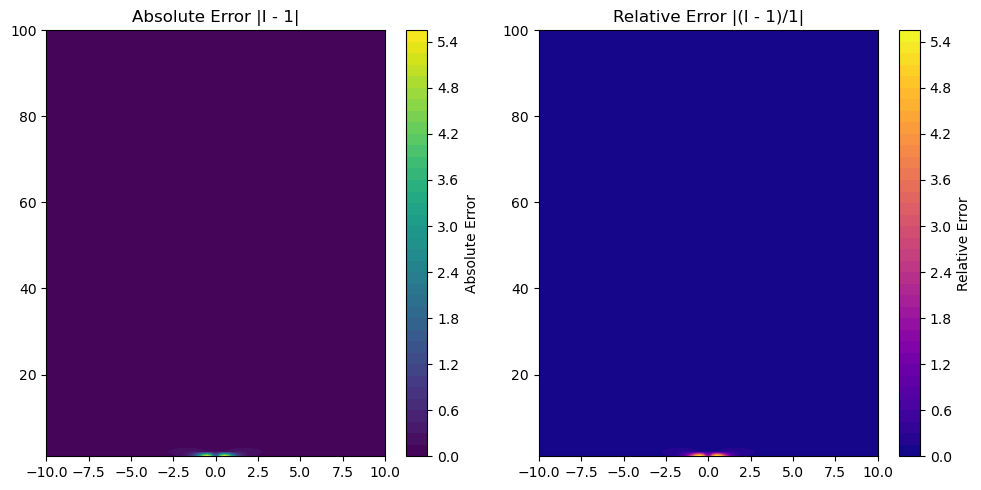

In [71]:
order = 2
# Define symbolic variables
x, xi = symbols('x xi', real=True)
u = Function('u')(x)

# Define the pseudo-differential symbol p(x, xi)
p_symbol = xi**2 + x**2 + 1

# Create the pseudo-differential operator
p = PseudoDifferentialOperator(expr=p_symbol, vars_x=[x], mode='symbol')

# Compute the left asymptotic inverse of the operator
left_inv = p.left_inverse_asymptotic(order=order)
print("Left asymptotic inverse:")
pprint(left_inv, num_columns=150)

# Create a new operator from the left inverse
p_left_inv = PseudoDifferentialOperator(expr=left_inv, vars_x=[x], mode='symbol')

# Verify the composition rule: L ∘ P ≈ I (identity operator)
composition = p_left_inv.compose_asymptotic(p, order=order)
print("Composition rule (L ∘ P):")
pprint(composition, num_columns=150)

# Simplify the result to check if it approximates the identity operator
identity_approximation = simplify(composition)
print("Simplified composition (should approximate 1):")
pprint(identity_approximation, num_columns=150)

# Development around xi -> infinity
series_expansion = series(identity_approximation, xi, oo, n=3)
print("Series expansion:", series_expansion)

# Convert to numerical function
identity_func = lambdify((x, xi), identity_approximation, 'numpy')

# Grid of points
x_vals = np.linspace(-10, 10, 100)
xi_vals = np.linspace(1, 100, 100)  # Positive frequencies
X, XI = np.meshgrid(x_vals, xi_vals, indexing='ij')

# Numerical evaluation
identity_vals = identity_func(X, XI)

absolute_error = np.abs(identity_vals - 1)
relative_error = np.abs((identity_vals - 1) / 1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.contourf(X, XI, absolute_error, levels=50, cmap='viridis')
plt.colorbar(label='Absolute Error')
plt.title('Absolute Error |I - 1|')

plt.subplot(1, 2, 2)
plt.contourf(X, XI, relative_error, levels=50, cmap='plasma')
plt.colorbar(label='Relative Error')
plt.title('Relative Error |(I - 1)/1|')

plt.tight_layout()
plt.show()


## $P ∘ R = Id$

Right asymptotic inverse:
                                                                                      ⎛            3            2                         ⎞          ↪
                                                                                      ⎜   192.0⋅ⅈ⋅x ⋅ξ       8⋅x          72.0⋅ⅈ⋅x⋅ξ      ⎟          ↪
                                                                                  1.0⋅⎜- ────────────── + ─────────── + ────────────── - 2⎟          ↪
                                                                                      ⎜               3    2    2                    2    ⎟          ↪
                             ⎛         2                                      ⎞       ⎜  ⎛ 2    2    ⎞    x  + ξ  + 1   ⎛ 2    2    ⎞     ⎟          ↪
                             ⎜ 24.0⋅ⅈ⋅x ⋅ξ          2⋅x            4.0⋅ⅈ⋅ξ    ⎟       ⎝  ⎝x  + ξ  + 1⎠                  ⎝x  + ξ  + 1⎠     ⎠          ↪
                   - 2.0⋅ⅈ⋅ξ⋅⎜────────────── - ────────────── - ────

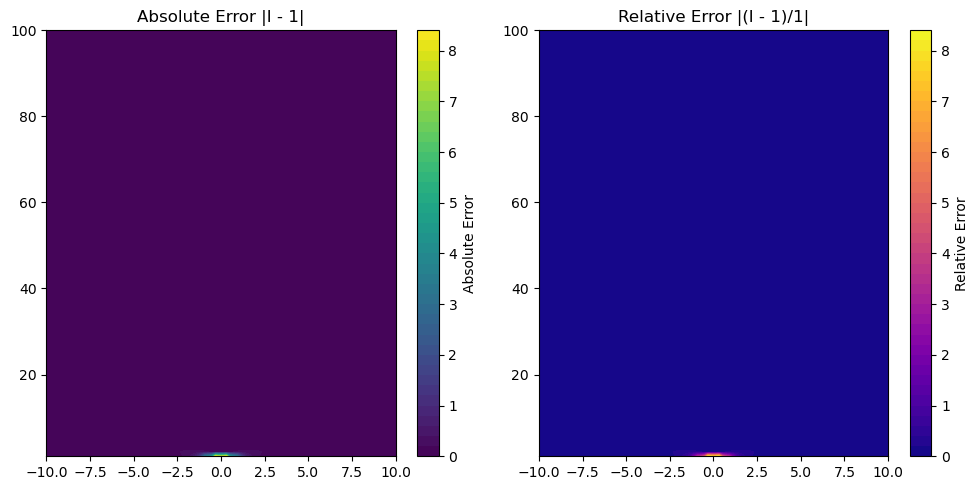

In [72]:
order = 2
# Define symbolic variables
x, xi = symbols('x xi', real=True)
u = Function('u')(x)

# Define the pseudo-differential symbol p(x, xi)
p_symbol = xi**2 + x**2 + 1

# Create the pseudo-differential operator
p = PseudoDifferentialOperator(expr=p_symbol, vars_x=[x], mode='symbol')

# Compute the left asymptotic inverse of the operator
right_inv = p.right_inverse_asymptotic(order=order)
print("Right asymptotic inverse:")
pprint(right_inv, num_columns=150)

# Create a new operator from the left inverse
p_right_inv = PseudoDifferentialOperator(expr=right_inv, vars_x=[x], mode='symbol')

# Verify the composition rule: L ∘ P ≈ I (identity operator)
composition = p.compose_asymptotic(p_right_inv, order=order)
print("Composition rule (P ∘ R ):")
pprint(composition, num_columns=150)

# Simplify the result to check if it approximates the identity operator
identity_approximation = simplify(composition)
print("Simplified composition (should approximate 1):")
pprint(identity_approximation, num_columns=150)

# Development around xi -> infinity
series_expansion = series(identity_approximation, xi, oo, n=3)
print("Series expansion:", series_expansion)

# Convert to numerical function
identity_func = lambdify((x, xi), identity_approximation, 'numpy')

# Grid of points
x_vals = np.linspace(-10, 10, 100)
xi_vals = np.linspace(1, 100, 100)  # Positive frequencies
X, XI = np.meshgrid(x_vals, xi_vals, indexing='ij')

# Numerical evaluation
identity_vals = identity_func(X, XI)

absolute_error = np.abs(identity_vals - 1)
relative_error = np.abs((identity_vals - 1) / 1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.contourf(X, XI, absolute_error, levels=50, cmap='viridis')
plt.colorbar(label='Absolute Error')
plt.title('Absolute Error |I - 1|')

plt.subplot(1, 2, 2)
plt.contourf(X, XI, relative_error, levels=50, cmap='plasma')
plt.colorbar(label='Relative Error')
plt.title('Relative Error |(I - 1)/1|')

plt.tight_layout()
plt.show()


## Trace
### 1D

In [73]:
x = symbols('x', real=True)
xi = symbols('xi', real=True)
p = exp(-(x**2 + xi**2))
P = PseudoDifferentialOperator(p, [x], mode='symbol')
trace = P.trace_formula()
print("Tr(P)=", trace)

Tr(P)= 1/2


In [74]:
trace_num = P.trace_formula(
     numerical=True,
     x_bounds=((-5, 5),),
     xi_bounds=((-5, 5),)
 )

Numerical trace = 5.000000e-01 ± 1.264337e-08


### Trace & Hermite's polynomials

In [75]:
n=6
for order in range(n):
    H_n = exp(-(x**2 + xi**2)/2) * hermite(order, x) * hermite(order, xi)
    P_n = PseudoDifferentialOperator(H_n, [x], mode='symbol')
    tr = P_n.trace_formula() 
    print("Tr(H_", order,")=",tr)

Tr(H_ 0 )= 1
Tr(H_ 1 )= 0
Tr(H_ 2 )= 4
Tr(H_ 3 )= 0
Tr(H_ 4 )= 144
Tr(H_ 5 )= 0


### Trace & Laguerre's polynomials

In [76]:
def wigner_function_harmonic_oscillator(n, x_sym, xi_sym):
    """
    Wigner function (phase space representation) for the n-th Fock state
    of the quantum harmonic oscillator.

    W_n(x, ξ) = (-1)^n / π * exp(-(x² + ξ²)) * L_n(2(x² + ξ²))

    where L_n is the Laguerre polynomial.
    """
    r_squared = x_sym**2 + xi_sym**2

    wigner = ((-1)**n / pi) * exp(-r_squared) * laguerre(n, 2*r_squared)

    return simplify(wigner)

# Example usage
n = 1
x_sym = symbols('x', real=True)
xi_sym = symbols('xi', real=True)
# Wigner function for the ground state
W_0 = wigner_function_harmonic_oscillator(n, x_sym, xi_sym)
print("Wigner function W_0(x, ξ) =")
pprint(W_0)
# Create the pseudo-differential operator
P_n = PseudoDifferentialOperator(W_0, [x_sym], mode='symbol')
# Calculate the trace (should be 1)
tr = P_n.trace_formula()
print(f"\nTrace for n={n}: {tr}")
print(f"Simplified: {simplify(tr)}")

# Symbolic variables
x = symbols('x', real=True)
xi = symbols('xi', real=True)
# Wigner function for different Fock states
for n in range(3):
    print(f"\n{'='*60}")
    print(f"Fock state n = {n}")
    print('='*60)

    # Calculate the Wigner function
    r_squared = x**2 + xi**2
    W_n = ((-1)**n / pi) * exp(-r_squared) * laguerre(n, 2*r_squared)

    print(f"\nW_{n}(x, ξ) =")
    pprint(simplify(W_n))

    # Create the operator
    P_n = PseudoDifferentialOperator(W_n, [x], mode='symbol')

    # Calculate the trace
    print(f"\nCalculating trace...")
    try:
        tr = P_n.trace_formula()
        print(f"Trace = {simplify(tr)}")

        # The trace should be 1 (normalization)
        tr_numerical = float(tr.evalf())
        print(f"Numerical value: {tr_numerical:.6f}")

        if abs(tr_numerical - 1.0/(2*pi)) < 1e-6:
            print("✓ Trace correctly normalized to 1/(2π)")
        else:
            print(f"⚠ Warning: trace ≠ 1/(2π) (got {tr_numerical})")

    except Exception as e:
        print(f"⚠ Symbolic integration failed: {e}")
        print("Trying numerical integration...")

        tr_num = P_n.trace_formula(
            numerical=True,
            x_bounds=((-5, 5),),
            xi_bounds=((-5, 5),)
        )
        print(f"Numerical trace ≈ {tr_num:.6f}")


Wigner function W_0(x, ξ) =
                      2    2
⎛   2      2    ⎞  - x  - ξ 
⎝2⋅x  + 2⋅ξ  - 1⎠⋅ℯ         
────────────────────────────
             π              

Trace for n=1: 1/(2*pi)
Simplified: 1/(2*pi)

Fock state n = 0

W_0(x, ξ) =
    2    2
 - x  - ξ 
ℯ         
──────────
    π     

Calculating trace...
Trace = 1/(2*pi)
Numerical value: 0.159155
✓ Trace correctly normalized to 1/(2π)

Fock state n = 1

W_1(x, ξ) =
                      2    2
⎛   2      2    ⎞  - x  - ξ 
⎝2⋅x  + 2⋅ξ  - 1⎠⋅ℯ         
────────────────────────────
             π              

Calculating trace...
Trace = 1/(2*pi)
Numerical value: 0.159155
✓ Trace correctly normalized to 1/(2π)

Fock state n = 2

W_2(x, ξ) =
⎛                           2    ⎞     2    2
⎜     2      2     ⎛ 2    2⎞     ⎟  - x  - ξ 
⎝- 4⋅x  - 4⋅ξ  + 2⋅⎝x  + ξ ⎠  + 1⎠⋅ℯ         
─────────────────────────────────────────────
                      π                      

Calculating trace...
Trace = 1/(2*pi)
Numerical v

## Exponential of P
### 1D

In [77]:
x = symbols('x', real=True)
xi = symbols('xi', real=True)
H = xi**2 + x**2  # Hamiltonian symbol
H_op = PseudoDifferentialOperator(H, [x], mode='symbol')
t_sym = symbols('t', real=True)
U_symbol = H_op.exponential_symbol(t=-I*t_sym, order=3)
print(U_symbol)
t0 = 0.001
expr = U_symbol.subs(t_sym, t0)
print(expr)

p1d = PseudoDifferentialOperator(expr=expr, vars_x=[x], mode='symbol')

p1d.interactive_symbol_analysis(
                            xlim=(-10, 10),
                            xi_range=(-10, 10),
                            density=50)

I*t**3*(-0.666666666666667*x**2 + 1.33333333333333*I*x*(I*x - xi*(x**2 + xi**2)) - 2.0*xi**2 - 0.166666666666667*(x**2 + xi**2)*(4.0*I*x*xi - 1.0*(x**2 + xi**2)**2 + 2.0)) + t**2*(2.0*I*x*xi - 0.5*(x**2 + xi**2)**2 + 1.0) - I*t*(x**2 + xi**2) + 1
2.0e-6*I*x*xi - 5.0e-7*(x**2 + xi**2)**2 - 0.001*I*(x**2 + xi**2) + 1.0e-9*I*(-0.666666666666667*x**2 + 1.33333333333333*I*x*(I*x - xi*(x**2 + xi**2)) - 2.0*xi**2 - 0.166666666666667*(x**2 + xi**2)*(4.0*I*x*xi - 1.0*(x**2 + xi**2)**2 + 2.0)) + 1.000001


#### Laplacian

In [78]:
Laplacian = -xi**2
L_op = PseudoDifferentialOperator(Laplacian, [x], mode='symbol')
heat_kernel = L_op.exponential_symbol(t=0.1, order=5)
print("Heat kernel:", heat_kernel)

Heat kernel: -8.33333333333334e-8*xi**10 + 4.16666666666667e-6*xi**8 - 0.000166666666666667*xi**6 + 0.005*xi**4 - 0.1*xi**2 + 1


#### Fractional Schrödinger

In [79]:
x, xi = symbols('x xi', real=True)
alpha = 1.5  # fractional exponent
H_frac = xi**alpha
H_frac_op = PseudoDifferentialOperator(H_frac, [x], mode='symbol')
t_sym = symbols('t', real=True)
U_frac_symbol = H_frac_op.exponential_symbol(t=-I*t_sym, order=3)
print("Fractional Schrödinger:", U_frac_symbol)

Fractional Schrödinger: 0.166666666666667*I*t**3*xi**4.5 - 0.5*t**2*xi**3.0 - I*t*xi**1.5 + 1


#### Gibbs partition function

In [80]:
x, xi = symbols('x xi', real=True)
H_classical = xi**2/2 + x**4/4  # Quartic Hamiltonian
H_classical_op = PseudoDifferentialOperator(H_classical, [x], mode='symbol')
beta = symbols('beta', real=True)  # Inverse temperature
Gibbs_symbol = H_classical_op.exponential_symbol(t=-beta, order=4)
print("Gibbs partition function:", Gibbs_symbol)


Gibbs partition function: beta**4*(0.000162760416666667*x**16 + 0.00130208333333333*x**12*xi**2 - 0.015625*I*x**11*xi - 0.0651041666666667*x**10 + 0.00390625*x**8*xi**4 - 0.0625*I*x**7*xi**3 - 0.427083333333333*x**6*xi**2 + 1.25*I*x**5*xi + 0.00520833333333333*x**4*xi**6 + 1.34375*x**4 - 0.0625*I*x**3*xi**5 - 0.34375*x**2*xi**4 + 0.75*I*x*xi**3 + 0.00260416666666667*xi**8 + 0.5*xi**2) + beta**3*(-0.00260416666666667*x**12 - 0.015625*x**8*xi**2 + 0.125*I*x**7*xi + 0.354166666666667*x**6 - 0.03125*x**4*xi**4 + 0.25*I*x**3*xi**3 + 0.875*x**2*xi**2 - 1.0*I*x*xi - 0.0208333333333333*xi**6 - 0.25) + beta**2*(-0.5*I*x**3*xi - 0.75*x**2 + 0.03125*(x**4 + 2*xi**2)**2) - beta*(x**4 + 2*xi**2)/4 + 1


### 2D
#### Heat kernel

In [81]:
x, y = symbols('x y', real=True)
xi, eta = symbols('xi eta', real=True)
# 2D Laplacian symbol
Laplacian_2D = - (xi**2 + eta**2)
# Define the 2D pseudodifferential operator
L_2D_op = PseudoDifferentialOperator(Laplacian_2D, [x, y], mode='symbol')
t_val = 0.05
# Compute the 2D heat kernel using exponential symbol
heat_kernel_2D = L_2D_op.exponential_symbol(t=t_val, order=4)
print("2D Diffusion:", heat_kernel_2D)


2D Diffusion: -0.05*eta**2 - 0.05*xi**2 + 2.60416666666667e-7*(eta**2 + xi**2)**4 - 2.08333333333333e-5*(eta**2 + xi**2)**3 + 0.00125*(eta**2 + xi**2)**2 + 1


#### Harmonic oscillator

In [82]:
x, y = symbols('x y', real=True)
xi, eta = symbols('xi eta', real=True)
H_2D = xi**2 + eta**2 + x**2 + y**2
H_2D_op = PseudoDifferentialOperator(H_2D, [x, y], mode='symbol')
t_sym = symbols('t', real=True)
U_2D_symbol = H_2D_op.exponential_symbol(t=-I*t_sym, order=3)
print("2D harmonic oscillator:", U_2D_symbol)

2D harmonic oscillator: I*t**3*(-2.66666666666667*eta**2 - 1.33333333333333*x**2 + 1.33333333333333*I*x*(I*x - xi*(eta**2 + x**2 + xi**2 + y**2)) - 2.66666666666667*xi**2 - 1.33333333333333*y**2 - 1.33333333333333*I*y*(eta*(eta**2 + x**2 + xi**2 + y**2) - I*y) - 0.166666666666667*(eta**2 + x**2 + xi**2 + y**2)*(4.0*I*eta*y + 4.0*I*x*xi - 1.0*(eta**2 + x**2 + xi**2 + y**2)**2 + 4.0)) + t**2*(2.0*I*eta*y + 2.0*I*x*xi - 0.5*(eta**2 + x**2 + xi**2 + y**2)**2 + 2.0) - I*t*(eta**2 + x**2 + xi**2 + y**2) + 1


In [83]:
t0 = 0.5
expr = U_2D_symbol.subs(t_sym, t0)

p2d = PseudoDifferentialOperator(expr=expr, vars_x=[x, y], mode='symbol')

p2d.interactive_symbol_analysis(
                            xlim=(-10, 10),
                            ylim=(-10, 10),
                            xi_range=(-10, 10),
                            eta_range=(-10, 10),
                            density=20)